# **1. Data Mounting**
### Configuring the connection between the data and the program.

## a. Mounting Google Drive and Loading Files

In [57]:
import pandas as pd
import glob
import matplotlib.pyplot as plt
from google.colab import drive
import os


# Mount Google Drive
drive.mount('/content/drive')

# Set the path to dataset folder in Google Drive
data_folder = "/content/drive/My Drive/ELEC3612 Crypto Project/Fintech Data/"  # Adjust the path as needed

# Load all CSV files from the folder
file_paths = glob.glob(data_folder + "*.csv")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **2. Initial Data Visualization**
### Plotting all cryptocurrencies by Price, Volume, and Market Cap.

## a. Plotting All Cryptocurrencies by Price

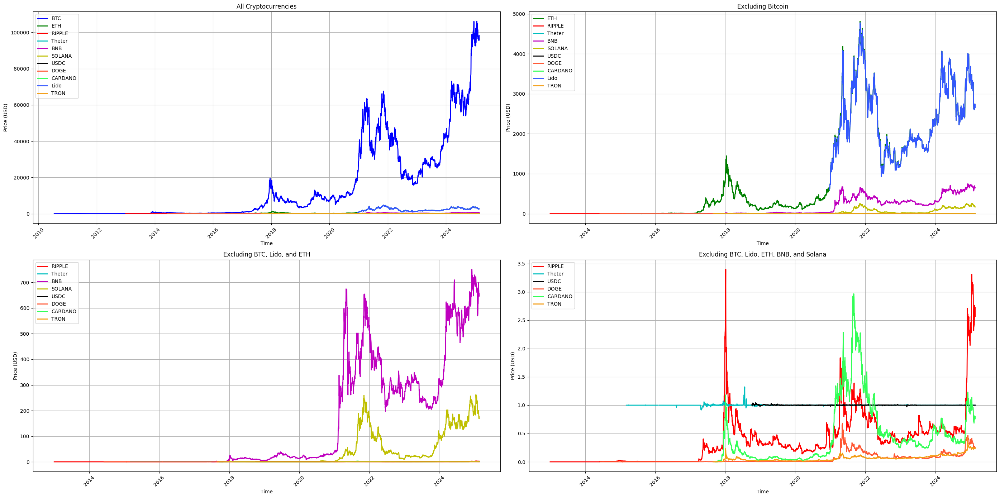

In [58]:
# Function to clean and plot cryptocurrency data on a given Axes
def plot_cryptos(ax, file_paths, exclude=None, title="Cryptocurrency Price Over Time"):
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', '#FF5733', '#33FF57', '#3357FF', '#F39C12']

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")

        if exclude and any(ex in crypto_name for ex in exclude):
            continue

        df = pd.read_csv(file)
        df['Date'] = df['Date'].str.replace(r' UTC\+\d+', '', regex=True)
        df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d %H:%M:%S')
        df = df.sort_values(by='Date')

        ax.plot(df['Date'], df['Price'], label=crypto_name, color=colors[idx % len(colors)], linewidth=2)

    ax.set_title(title)
    ax.set_xlabel("Time")
    ax.set_ylabel("Price (USD)")
    ax.legend()
    ax.grid(True)
    ax.tick_params(axis='x', rotation=45)

# Plot configurations (first four only)
plot_configs = [
    {"exclude": None, "title": "All Cryptocurrencies"},
    {"exclude": ["BTC"], "title": "Excluding Bitcoin"},
    {"exclude": ["BTC", "Lido", "ETH"], "title": "Excluding BTC, Lido, and ETH"},
    {"exclude": ["BTC", "Lido", "ETH", "BNB", "SOLANA"], "title": "Excluding BTC, Lido, ETH, BNB, and Solana"},
]

# Create 2x2 subplot layout
fig, axes = plt.subplots(2, 2, figsize=(28, 14))
axes = axes.flatten()

# Generate the selected plots
for idx, config in enumerate(plot_configs):
    plot_cryptos(axes[idx], file_paths, exclude=config["exclude"], title=config["title"])

plt.tight_layout()
plt.show()

## b. Plotting All Cryptocurrencies by Volume

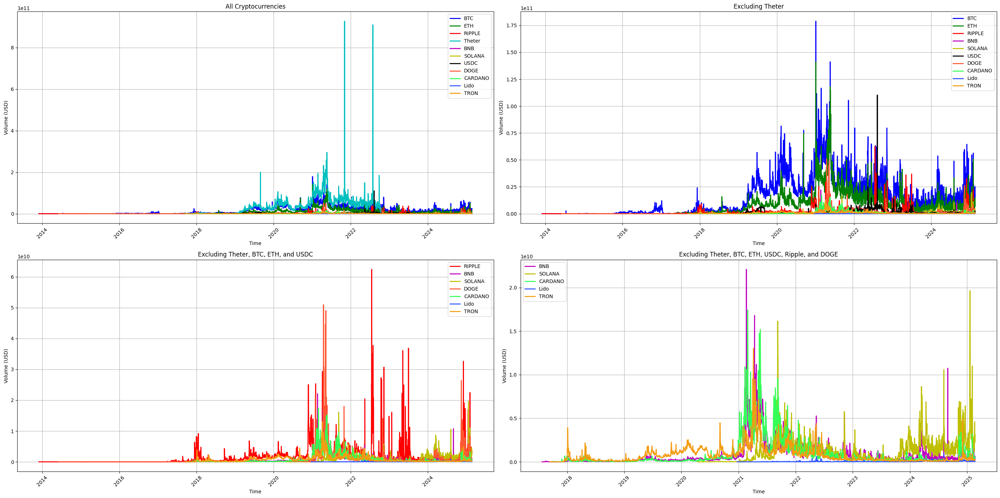

In [59]:
# Function to clean and plot cryptocurrency volume data on a given Axes
def plot_cryptos(ax, file_paths, exclude=None, title="Cryptocurrency Volume Over Time"):
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', '#FF5733', '#33FF57', '#3357FF', '#F39C12']

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")

        if exclude and any(ex in crypto_name for ex in exclude):
            continue

        df = pd.read_csv(file)
        df['Date'] = df['Date'].str.replace(r' UTC\+\d+', '', regex=True)
        df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d %H:%M:%S')
        df = df.sort_values(by='Date')

        ax.plot(df['Date'], df['Volume'], label=crypto_name, color=colors[idx % len(colors)], linewidth=2)

    ax.set_title(title)
    ax.set_xlabel("Time")
    ax.set_ylabel("Volume (USD)")
    ax.legend()
    ax.grid(True)
    ax.tick_params(axis='x', rotation=45)

# Plot configurations (first four only)
plot_configs = [
    {"exclude": None, "title": "All Cryptocurrencies"},
    {"exclude": ["Theter"], "title": "Excluding Theter"},
    {"exclude": ["Theter", "BTC", "ETH", "USDC"], "title": "Excluding Theter, BTC, ETH, and USDC"},
    {"exclude": ["Theter", "BTC", "ETH", "USDC", "RIPPLE", "DOGE"], "title": "Excluding Theter, BTC, ETH, USDC, Ripple, and DOGE"},
]

# Create 2x2 subplot layout
fig, axes = plt.subplots(2, 2, figsize=(28, 14))
axes = axes.flatten()

# Generate the selected plots
for idx, config in enumerate(plot_configs):
    plot_cryptos(axes[idx], file_paths, exclude=config["exclude"], title=config["title"])

plt.tight_layout()
plt.show()

## c. Plotting All Cryptocurrencies by Market Cap

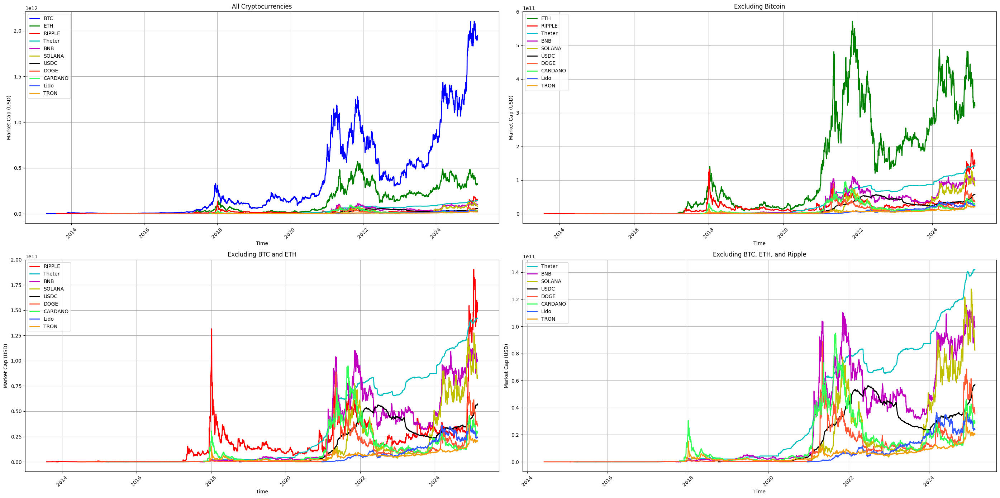

In [60]:
# Function to clean and plot cryptocurrency market cap data on a given Axes
def plot_cryptos_market_cap(ax, file_paths, exclude=None, title="Cryptocurrency Market Cap Over Time"):
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', '#FF5733', '#33FF57', '#3357FF', '#F39C12']

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")

        if exclude and any(ex in crypto_name for ex in exclude):
            continue

        df = pd.read_csv(file)
        df['Date'] = df['Date'].str.replace(r' UTC\+\d+', '', regex=True)
        df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d %H:%M:%S')
        df = df.sort_values(by='Date')

        ax.plot(df['Date'], df['Market_cap'], label=crypto_name, color=colors[idx % len(colors)], linewidth=2)

    ax.set_title(title)
    ax.set_xlabel("Time")
    ax.set_ylabel("Market Cap (USD)")
    ax.legend()
    ax.grid(True)
    ax.tick_params(axis='x', rotation=45)

# Plot configurations (first four only)
plot_configs = [
    {"exclude": None, "title": "All Cryptocurrencies"},
    {"exclude": ["BTC"], "title": "Excluding Bitcoin"},
    {"exclude": ["BTC", "ETH"], "title": "Excluding BTC and ETH"},
    {"exclude": ["BTC", "ETH", "RIPPLE"], "title": "Excluding BTC, ETH, and Ripple"},
]

# Create 2x2 subplot layout
fig, axes = plt.subplots(2, 2, figsize=(28, 14))
axes = axes.flatten()

# Generate the selected plots
for idx, config in enumerate(plot_configs):
    plot_cryptos_market_cap(axes[idx], file_paths, exclude=config["exclude"], title=config["title"])

plt.tight_layout()
plt.show()

# **3. Data Transforming & Cleaning**
### Inspecting, transforming and cleaning the dataset to ensure high quality results and optimal formatting.

## a. Checking Missing & Duplicate Values

In [61]:
# Check missing values and duplicates in each file
for file in file_paths:
    df = pd.read_csv(file)

    # Extract the cryptocurrency name from the filename
    crypto_name = file.split("/")[-1]

    # Get missing values per column
    missing_values = df.isnull().sum()

    # Check for duplicate rows
    duplicate_rows = df.duplicated().sum()

    # Format output for missing values as a single line
    missing_values_str = ", ".join([f"{col} ({missing_values[col]})" for col in df.columns])

    # Print the results
    print(f"Missing values in {crypto_name}: {missing_values_str}")
    print(f"Duplicate rows in {crypto_name}: {duplicate_rows}")

Missing values in BTC.csv: Date (0), Price (1), Volume (1232), Market_cap (1018)
Duplicate rows in BTC.csv: 0
Missing values in ETH.csv: Date (0), Price (1), Volume (1), Market_cap (2)
Duplicate rows in ETH.csv: 0
Missing values in RIPPLE.csv: Date (0), Price (0), Volume (333), Market_cap (220)
Duplicate rows in RIPPLE.csv: 0
Missing values in Theter.csv: Date (0), Price (23), Volume (23), Market_cap (23)
Duplicate rows in Theter.csv: 0
Missing values in BNB.csv: Date (0), Price (2), Volume (22), Market_cap (75)
Duplicate rows in BNB.csv: 0
Missing values in SOLANA.csv: Date (0), Price (0), Volume (0), Market_cap (0)
Duplicate rows in SOLANA.csv: 0
Missing values in USDC.csv: Date (0), Price (0), Volume (0), Market_cap (0)
Duplicate rows in USDC.csv: 0
Missing values in DOGE.csv: Date (0), Price (1), Volume (1), Market_cap (2)
Duplicate rows in DOGE.csv: 0
Missing values in CARDANO.csv: Date (0), Price (0), Volume (8), Market_cap (25)
Duplicate rows in CARDANO.csv: 0
Missing values in 

## b. Transforming & Cleaning Data

In [62]:
# Transform, clean, normalize, and save each file
from sklearn.preprocessing import MinMaxScaler

save_folder = "/content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/"

# Create the folder if it doesn't exist
os.makedirs(save_folder, exist_ok=True)

for file in file_paths:
    df = pd.read_csv(file)

    # Extract the cryptocurrency name from the filename
    crypto_name = file.split("/")[-1]

    # Convert 'Date' to datetime
    df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')

    # Ensure numeric columns are correctly typed
    numeric_cols = ['Price', 'Volume', 'Market_cap']
    for col in numeric_cols:
        df[col] = pd.to_numeric(df[col], errors='coerce')

    # Drop rows with any missing or invalid data
    df.dropna(inplace=True)

    # Sort by Date
    df = df.sort_values('Date').reset_index(drop=True)

    # Set 'Date' as index
    df.set_index('Date', inplace=True)

    scaler = MinMaxScaler()

    # Fit and transform only the numeric columns
    normalized_values = scaler.fit_transform(df[numeric_cols])

    # Create new columns for normalized data
    df['Price_normalized'] = normalized_values[:, 0]
    df['Volume_normalized'] = normalized_values[:, 1]
    df['Market_cap_normalized'] = normalized_values[:, 2]

    # Save cleaned and transformed file
    save_path = os.path.join(save_folder, "Cleaned_" + crypto_name)
    df.to_csv(save_path)

    # Print confirmation
    print(f"Cleaned, normalized, and saved {crypto_name} to {save_path}")

<ipython-input-62-ddb479502c9d>:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')


Cleaned, normalized, and saved BTC.csv to /content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/Cleaned_BTC.csv


<ipython-input-62-ddb479502c9d>:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')


Cleaned, normalized, and saved ETH.csv to /content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/Cleaned_ETH.csv


<ipython-input-62-ddb479502c9d>:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')


Cleaned, normalized, and saved RIPPLE.csv to /content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/Cleaned_RIPPLE.csv


<ipython-input-62-ddb479502c9d>:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')


Cleaned, normalized, and saved Theter.csv to /content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/Cleaned_Theter.csv


<ipython-input-62-ddb479502c9d>:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')


Cleaned, normalized, and saved BNB.csv to /content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/Cleaned_BNB.csv


<ipython-input-62-ddb479502c9d>:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')


Cleaned, normalized, and saved SOLANA.csv to /content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/Cleaned_SOLANA.csv


<ipython-input-62-ddb479502c9d>:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')


Cleaned, normalized, and saved USDC.csv to /content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/Cleaned_USDC.csv


<ipython-input-62-ddb479502c9d>:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')


Cleaned, normalized, and saved DOGE.csv to /content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/Cleaned_DOGE.csv


<ipython-input-62-ddb479502c9d>:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')


Cleaned, normalized, and saved CARDANO.csv to /content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/Cleaned_CARDANO.csv


<ipython-input-62-ddb479502c9d>:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')


Cleaned, normalized, and saved Lido.csv to /content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/Cleaned_Lido.csv


<ipython-input-62-ddb479502c9d>:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')


Cleaned, normalized, and saved TRON.csv to /content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/Cleaned_TRON.csv


## c. Re-Checking Missing & Duplicate Values

In [63]:
# Get all cleaned file paths
cleaned_file_paths = glob.glob(save_folder + "*.csv")

for file in cleaned_file_paths:
    df = pd.read_csv(file)

    # Extract the cryptocurrency name from the filename
    crypto_name = file.split("/")[-1]

    # Get missing values per column
    missing_values = df.isnull().sum()

    # Check for duplicate rows
    duplicate_rows = df.duplicated().sum()

    # Format output for missing values as a single line
    missing_values_str = ", ".join([f"{col} ({missing_values[col]})" for col in df.columns])

    # Print the results
    print(f"[CLEANED] Missing values in {crypto_name}: {missing_values_str}")
    print(f"[CLEANED] Duplicate rows in {crypto_name}: {duplicate_rows}")


[CLEANED] Missing values in Cleaned_BTC.csv: Date (0), Price (0), Volume (0), Market_cap (0), Price_normalized (0), Volume_normalized (0), Market_cap_normalized (0)
[CLEANED] Duplicate rows in Cleaned_BTC.csv: 0
[CLEANED] Missing values in Cleaned_ETH.csv: Date (0), Price (0), Volume (0), Market_cap (0), Price_normalized (0), Volume_normalized (0), Market_cap_normalized (0)
[CLEANED] Duplicate rows in Cleaned_ETH.csv: 0
[CLEANED] Missing values in Cleaned_RIPPLE.csv: Date (0), Price (0), Volume (0), Market_cap (0), Price_normalized (0), Volume_normalized (0), Market_cap_normalized (0)
[CLEANED] Duplicate rows in Cleaned_RIPPLE.csv: 0
[CLEANED] Missing values in Cleaned_Theter.csv: Date (0), Price (0), Volume (0), Market_cap (0), Price_normalized (0), Volume_normalized (0), Market_cap_normalized (0)
[CLEANED] Duplicate rows in Cleaned_Theter.csv: 0
[CLEANED] Missing values in Cleaned_BNB.csv: Date (0), Price (0), Volume (0), Market_cap (0), Price_normalized (0), Volume_normalized (0), M

# **4. Cleaned & Normalized Data Visualization**
### Plotting all cryptocurrencies by cleaned and normalized Price, Volume, and Market Cap.

## a. Plotting All Cleaned Cryptocurrencies by Price

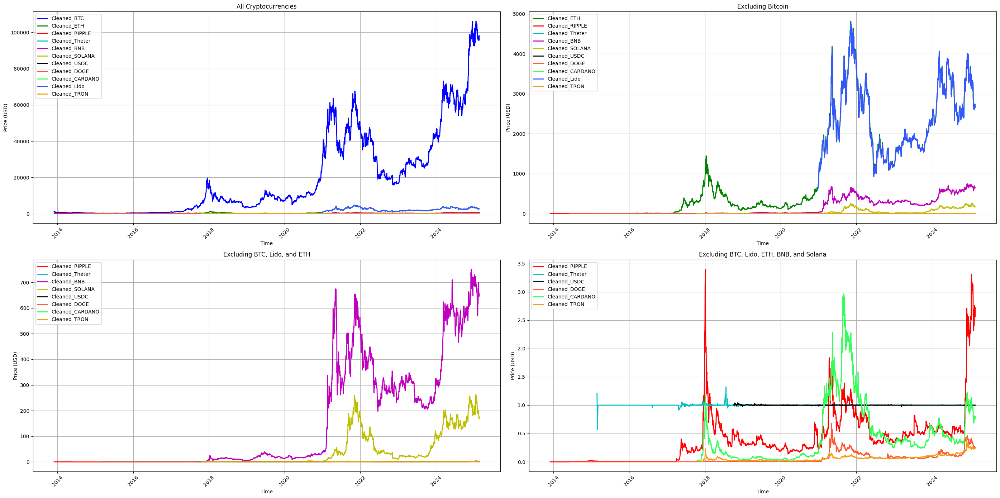

In [64]:
# Function to plot cleaned cryptocurrency data
def plot_cryptos(ax, file_paths, exclude=None, title="Cryptocurrency Price Over Time"):
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', '#FF5733', '#33FF57', '#3357FF', '#F39C12']

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")

        if exclude and any(ex in crypto_name for ex in exclude):
            continue

        df = pd.read_csv(file)

        # The cleaned files already have 'Date' properly formatted and set as index
        df.reset_index(inplace=True)  # Move Date back to a column if it is index
        df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')  # Just in case
        df = df.sort_values(by='Date')

        ax.plot(df['Date'], df['Price'], label=crypto_name, color=colors[idx % len(colors)], linewidth=2)

    ax.set_title(title)
    ax.set_xlabel("Time")
    ax.set_ylabel("Price (USD)")
    ax.legend()
    ax.grid(True)
    ax.tick_params(axis='x', rotation=45)

# New file paths: cleaned files
cleaned_file_paths = glob.glob("/content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/*.csv")

# Plot configurations (first four only)
plot_configs = [
    {"exclude": None, "title": "All Cryptocurrencies"},
    {"exclude": ["BTC"], "title": "Excluding Bitcoin"},
    {"exclude": ["BTC", "Lido", "ETH"], "title": "Excluding BTC, Lido, and ETH"},
    {"exclude": ["BTC", "Lido", "ETH", "BNB", "SOLANA"], "title": "Excluding BTC, Lido, ETH, BNB, and Solana"},
]

# Create 2x2 subplot layout
fig, axes = plt.subplots(2, 2, figsize=(28, 14))
axes = axes.flatten()

# Generate the selected plots
for idx, config in enumerate(plot_configs):
    plot_cryptos(axes[idx], cleaned_file_paths, exclude=config["exclude"], title=config["title"])

plt.tight_layout()
plt.show()

## b. Plotting All Cleaned Cryptocurrencies by Volume

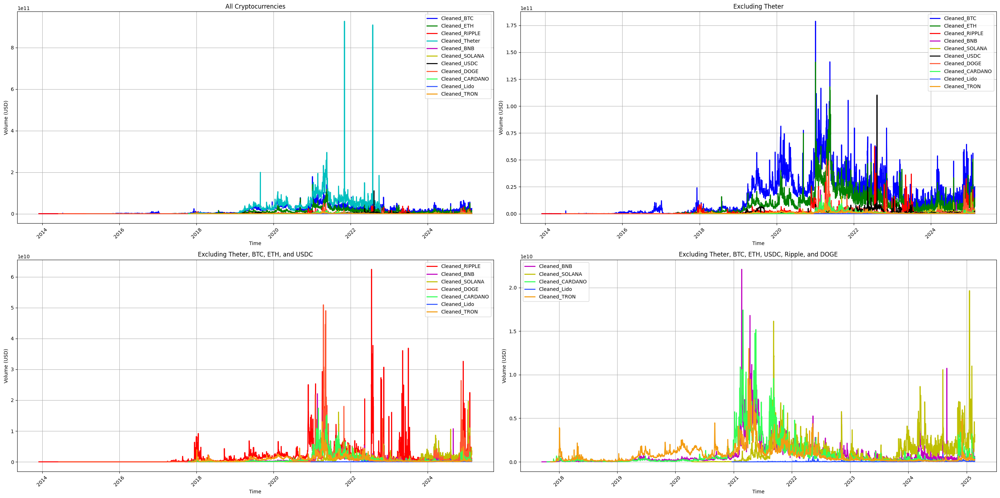

In [65]:
# Function to plot cleaned cryptocurrency volume data
def plot_cryptos(ax, file_paths, exclude=None, title="Cryptocurrency Volume Over Time"):
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', '#FF5733', '#33FF57', '#3357FF', '#F39C12']

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")

        if exclude and any(ex in crypto_name for ex in exclude):
            continue

        df = pd.read_csv(file)

        # Reset index because Date was saved as index
        df.reset_index(inplace=True)
        df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')  # just in case
        df = df.sort_values(by='Date')

        ax.plot(df['Date'], df['Volume'], label=crypto_name, color=colors[idx % len(colors)], linewidth=2)

    ax.set_title(title)
    ax.set_xlabel("Time")
    ax.set_ylabel("Volume (USD)")
    ax.legend()
    ax.grid(True)
    ax.tick_params(axis='x', rotation=45)

# New file paths: cleaned files
cleaned_file_paths = glob.glob("/content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/*.csv")

# Plot configurations (first four only)
plot_configs = [
    {"exclude": None, "title": "All Cryptocurrencies"},
    {"exclude": ["Theter"], "title": "Excluding Theter"},
    {"exclude": ["Theter", "BTC", "ETH", "USDC"], "title": "Excluding Theter, BTC, ETH, and USDC"},
    {"exclude": ["Theter", "BTC", "ETH", "USDC", "RIPPLE", "DOGE"], "title": "Excluding Theter, BTC, ETH, USDC, Ripple, and DOGE"},
]

# Create 2x2 subplot layout
fig, axes = plt.subplots(2, 2, figsize=(28, 14))
axes = axes.flatten()

# Generate the selected plots
for idx, config in enumerate(plot_configs):
    plot_cryptos(axes[idx], cleaned_file_paths, exclude=config["exclude"], title=config["title"])

plt.tight_layout()
plt.show()

## c. Plotting All Cleaned Cryptocurrencies by Market Cap

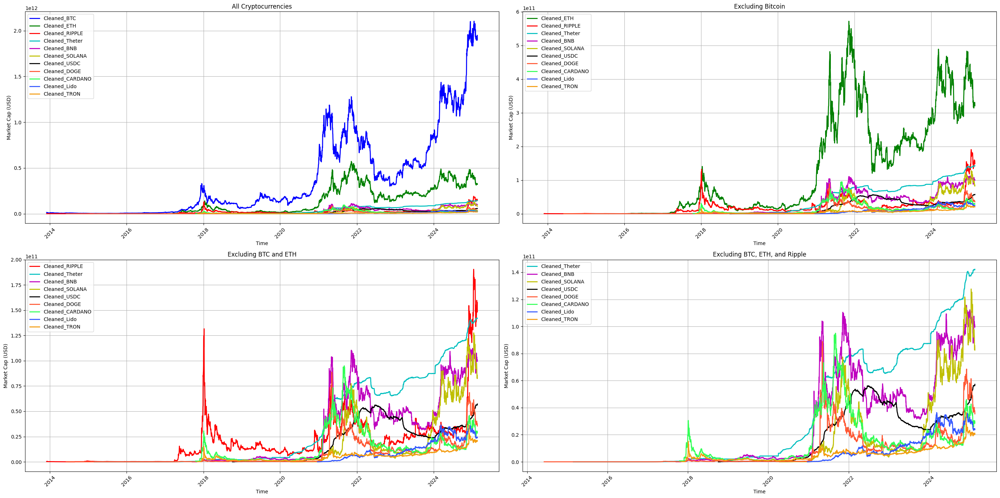

In [66]:
# Function to plot cleaned cryptocurrency market cap data
def plot_cryptos_market_cap(ax, file_paths, exclude=None, title="Cryptocurrency Market Cap Over Time"):
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', '#FF5733', '#33FF57', '#3357FF', '#F39C12']

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")

        if exclude and any(ex in crypto_name for ex in exclude):
            continue

        df = pd.read_csv(file)

        # Reset index because Date was saved as index
        df.reset_index(inplace=True)
        df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')  # in case
        df = df.sort_values(by='Date')

        ax.plot(df['Date'], df['Market_cap'], label=crypto_name, color=colors[idx % len(colors)], linewidth=2)

    ax.set_title(title)
    ax.set_xlabel("Time")
    ax.set_ylabel("Market Cap (USD)")
    ax.legend()
    ax.grid(True)
    ax.tick_params(axis='x', rotation=45)

# New file paths: cleaned files
cleaned_file_paths = glob.glob("/content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/*.csv")

# Plot configurations (first four only)
plot_configs = [
    {"exclude": None, "title": "All Cryptocurrencies"},
    {"exclude": ["BTC"], "title": "Excluding Bitcoin"},
    {"exclude": ["BTC", "ETH"], "title": "Excluding BTC and ETH"},
    {"exclude": ["BTC", "ETH", "RIPPLE"], "title": "Excluding BTC, ETH, and Ripple"},
]

# Create 2x2 subplot layout
fig, axes = plt.subplots(2, 2, figsize=(28, 14))
axes = axes.flatten()

# Generate the selected plots
for idx, config in enumerate(plot_configs):
    plot_cryptos_market_cap(axes[idx], cleaned_file_paths, exclude=config["exclude"], title=config["title"])

plt.tight_layout()
plt.show()

## d. Plotting All Normalized Cryptocurrencies by Price

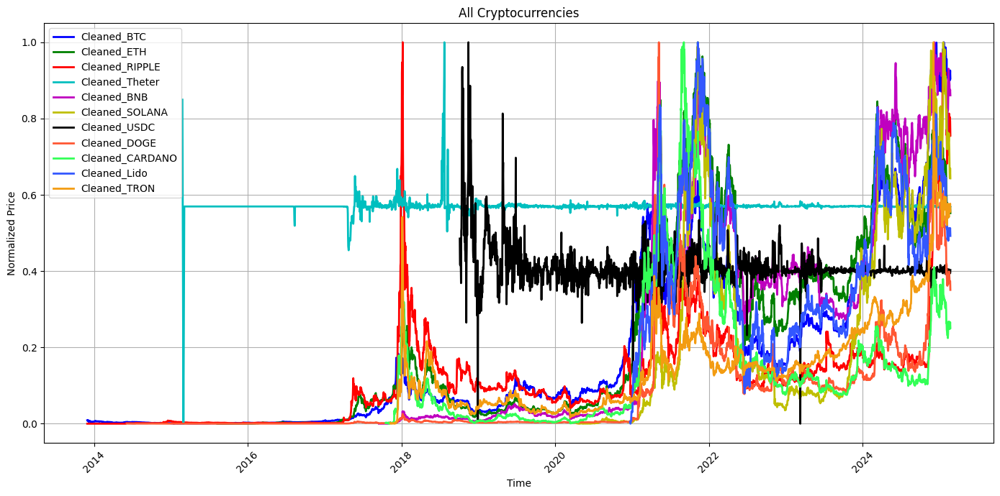

In [67]:
# Function to plot cleaned cryptocurrency normalized price data
def plot_cryptos(ax, file_paths, exclude=None, title="Cryptocurrency Normalized Price Over Time"):
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', '#FF5733', '#33FF57', '#3357FF', '#F39C12']

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")

        if exclude and any(ex in crypto_name for ex in exclude):
            continue

        df = pd.read_csv(file)

        df.reset_index(inplace=True)  # Move Date back to a column if it is index
        df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')  # Just in case
        df = df.sort_values(by='Date')

        ax.plot(df['Date'], df['Price_normalized'], label=crypto_name, color=colors[idx % len(colors)], linewidth=2)

    ax.set_title(title)
    ax.set_xlabel("Time")
    ax.set_ylabel("Normalized Price")
    ax.legend()
    ax.grid(True)
    ax.tick_params(axis='x', rotation=45)

# New file paths: cleaned files
cleaned_file_paths = glob.glob("/content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/*.csv")

# Only the first configuration (All Cryptocurrencies)
plot_configs = [
    {"exclude": None, "title": "All Cryptocurrencies"}
]

# Create subplot layout
fig, ax = plt.subplots(figsize=(14, 7))

# Generate the selected plot (only first config)
plot_cryptos(ax, cleaned_file_paths, exclude=plot_configs[0]["exclude"], title=plot_configs[0]["title"])

plt.tight_layout()
plt.show()


## e. Plotting All Normalized Cryptocurrencies by Volume

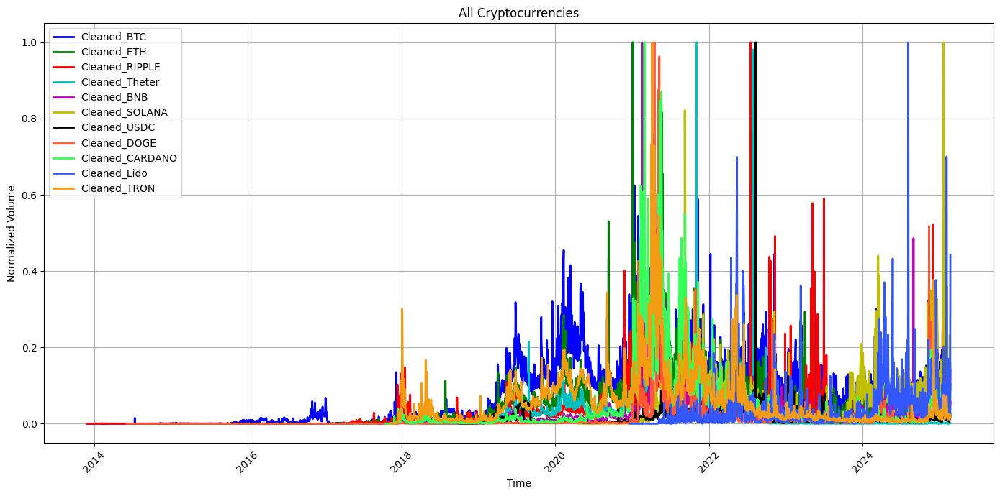

In [68]:
# Function to plot cleaned cryptocurrency normalized volume data
def plot_cryptos(ax, file_paths, exclude=None, title="Cryptocurrency Normalized Volume Over Time"):
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', '#FF5733', '#33FF57', '#3357FF', '#F39C12']

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")

        if exclude and any(ex in crypto_name for ex in exclude):
            continue

        df = pd.read_csv(file)

        # Reset index because Date was saved as index
        df.reset_index(inplace=True)
        df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')  # Just in case
        df = df.sort_values(by='Date')

        ax.plot(df['Date'], df['Volume_normalized'], label=crypto_name, color=colors[idx % len(colors)], linewidth=2)

    ax.set_title(title)
    ax.set_xlabel("Time")
    ax.set_ylabel("Normalized Volume")
    ax.legend()
    ax.grid(True)
    ax.tick_params(axis='x', rotation=45)

# New file paths: cleaned files
cleaned_file_paths = glob.glob("/content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/*.csv")

# Only the first configuration (All Cryptocurrencies)
plot_configs = [
    {"exclude": None, "title": "All Cryptocurrencies"}
]

# Create subplot layout
fig, ax = plt.subplots(figsize=(14, 7))

# Generate the selected plot (only first config)
plot_cryptos(ax, cleaned_file_paths, exclude=plot_configs[0]["exclude"], title=plot_configs[0]["title"])

plt.tight_layout()
plt.show()


## f. Plotting All Normalized Cryptocurrencies by Market Cap

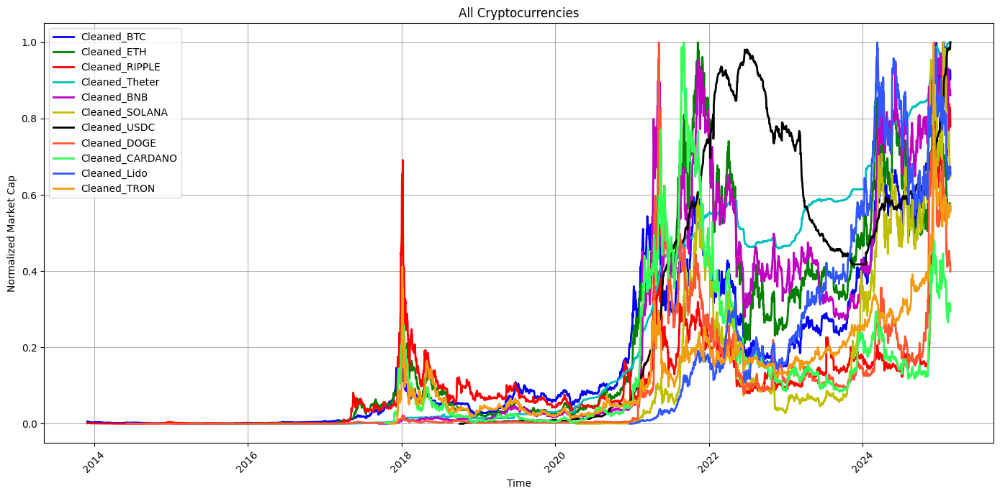

In [69]:
# Function to plot cleaned cryptocurrency normalized market cap data
def plot_cryptos_market_cap(ax, file_paths, exclude=None, title="Cryptocurrency Normalized Market Cap Over Time"):
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', '#FF5733', '#33FF57', '#3357FF', '#F39C12']

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")

        if exclude and any(ex in crypto_name for ex in exclude):
            continue

        df = pd.read_csv(file)

        # Reset index because Date was saved as index
        df.reset_index(inplace=True)
        df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')  # Just in case
        df = df.sort_values(by='Date')

        ax.plot(df['Date'], df['Market_cap_normalized'], label=crypto_name, color=colors[idx % len(colors)], linewidth=2)

    ax.set_title(title)
    ax.set_xlabel("Time")
    ax.set_ylabel("Normalized Market Cap")
    ax.legend()
    ax.grid(True)
    ax.tick_params(axis='x', rotation=45)

# New file paths: cleaned files
cleaned_file_paths = glob.glob("/content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/*.csv")

# Only the first configuration (All Cryptocurrencies)
plot_configs = [
    {"exclude": None, "title": "All Cryptocurrencies"}
]

# Create subplot layout
fig, ax = plt.subplots(figsize=(14, 7))

# Generate the selected plot (only first config)
plot_cryptos_market_cap(ax, cleaned_file_paths, exclude=plot_configs[0]["exclude"], title=plot_configs[0]["title"])

plt.tight_layout()
plt.show()


## g. Plotting All Normalized Cryptocurrencies by Price, No Stablecoins

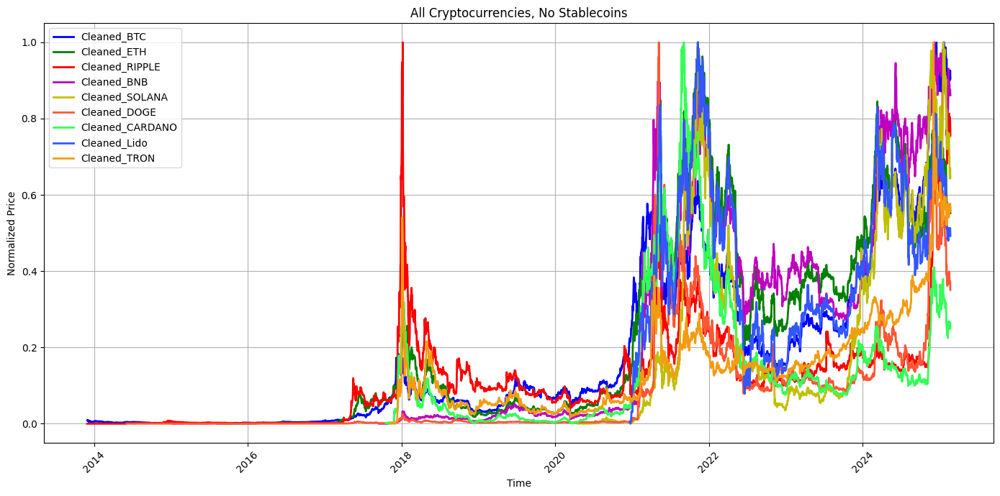

In [70]:
# Function to plot cleaned cryptocurrency normalized price data
def plot_cryptos(ax, file_paths, exclude=None, title="Cryptocurrency Normalized Price Over Time"):
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', '#FF5733', '#33FF57', '#3357FF', '#F39C12']

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")

        if exclude and any(ex in crypto_name for ex in exclude):
            continue

        df = pd.read_csv(file)

        df.reset_index(inplace=True)  # Move Date back to a column if it is index
        df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')  # Just in case
        df = df.sort_values(by='Date')

        ax.plot(df['Date'], df['Price_normalized'], label=crypto_name, color=colors[idx % len(colors)], linewidth=2)

    ax.set_title(title)
    ax.set_xlabel("Time")
    ax.set_ylabel("Normalized Price")
    ax.legend()
    ax.grid(True)
    ax.tick_params(axis='x', rotation=45)

# New file paths: cleaned files
cleaned_file_paths = glob.glob("/content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/*.csv")

plot_configs = [
    {"exclude": ["Cleaned_Theter", "Cleaned_USDC"], "title": "All Cryptocurrencies, No Stablecoins"}
]

# Create subplot layout
fig, ax = plt.subplots(figsize=(14, 7))

# Generate the selected plot (only first config)
plot_cryptos(ax, cleaned_file_paths, exclude=plot_configs[0]["exclude"], title=plot_configs[0]["title"])

plt.tight_layout()
plt.show()


## h. Plotting All Normalized Cryptocurrencies by Market Cap, No Stablecoins

1.   List item
2.   List item



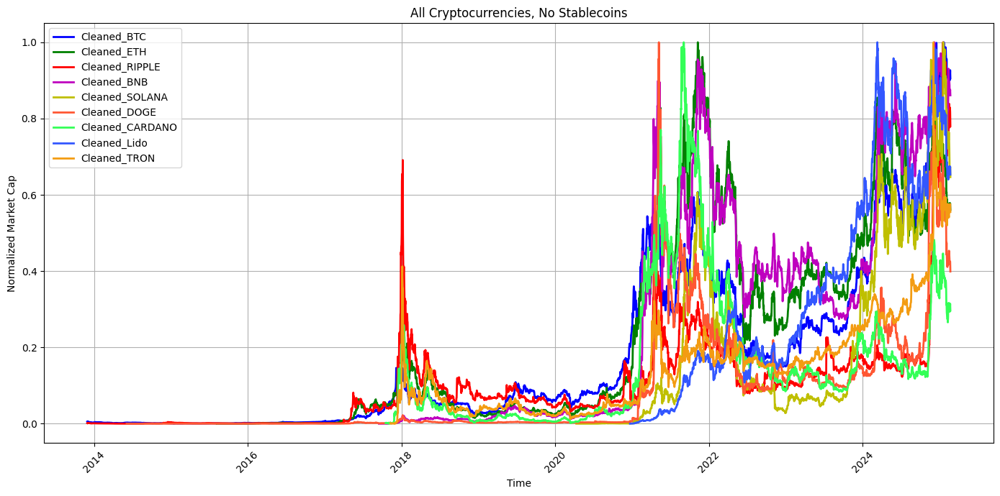

In [71]:
# Function to plot cleaned cryptocurrency normalized market cap data
def plot_cryptos_market_cap(ax, file_paths, exclude=None, title="Cryptocurrency Normalized Market Cap Over Time"):
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', '#FF5733', '#33FF57', '#3357FF', '#F39C12']

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")

        if exclude and any(ex in crypto_name for ex in exclude):
            continue

        df = pd.read_csv(file)

        # Reset index because Date was saved as index
        df.reset_index(inplace=True)
        df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')  # Just in case
        df = df.sort_values(by='Date')

        ax.plot(df['Date'], df['Market_cap_normalized'], label=crypto_name, color=colors[idx % len(colors)], linewidth=2)

    ax.set_title(title)
    ax.set_xlabel("Time")
    ax.set_ylabel("Normalized Market Cap")
    ax.legend()
    ax.grid(True)
    ax.tick_params(axis='x', rotation=45)

# New file paths: cleaned files
cleaned_file_paths = glob.glob("/content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/*.csv")

plot_configs = [
    {"exclude": ["Cleaned_Theter", "Cleaned_USDC"], "title": "All Cryptocurrencies, No Stablecoins"}
]

# Create subplot layout
fig, ax = plt.subplots(figsize=(14, 7))

# Generate the selected plot (only first config)
plot_cryptos_market_cap(ax, cleaned_file_paths, exclude=plot_configs[0]["exclude"], title=plot_configs[0]["title"])

plt.tight_layout()
plt.show()


# **5. Statistical Pattern Recognition**
### Calculating basic statistical measures and identifying trends and patterns.

## a. Calculating Basic Statistical Measures

In [72]:
# Function to calculate basic statistics for each cryptocurrency dataset
def calculate_statistics(file_paths):
    statistics = {}

    for file in file_paths:
        crypto_name = os.path.basename(file).replace(".csv", "")
        df = pd.read_csv(file)

        # Reset index because Date was saved as index
        df.reset_index(inplace=True)
        df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')
        df = df.sort_values(by='Date')

        # Calculate basic statistical measures
        stats = {
            "mean_price": df['Price'].mean(),
            "median_price": df['Price'].median(),
            "std_dev_price": df['Price'].std(),
            "mean_volume": df['Volume'].mean(),
            "median_volume": df['Volume'].median(),
            "std_dev_volume": df['Volume'].std(),
            "mean_market_cap": df['Market_cap'].mean(),
            "median_market_cap": df['Market_cap'].median(),
            "std_dev_market_cap": df['Market_cap'].std(),
            "correlation_price_volume": df['Price'].corr(df['Volume']),
            "correlation_price_market_cap": df['Price'].corr(df['Market_cap']),
            "correlation_volume_market_cap": df['Volume'].corr(df['Market_cap']),
        }
        statistics[crypto_name] = stats

    return statistics

# New file paths: cleaned files
cleaned_file_paths = glob.glob("/content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/*.csv")

# Calculate basic statistics for all cryptocurrencies
statistics = calculate_statistics(cleaned_file_paths)

# Print statistics for each cryptocurrency
for crypto, stats in statistics.items():
    print(f"Statistics for {crypto}:")
    for stat, value in stats.items():
        print(f"  {stat}: {value}")
    print("\n")


Statistics for Cleaned_BTC:
  mean_price: 19259.849667069506
  median_price: 8710.022479695
  std_dev_price: 23551.451969969257
  mean_volume: 14724577587.563084
  median_volume: 8132239132.828295
  std_dev_volume: 17370915026.353333
  mean_market_cap: 367328876152.6327
  median_market_cap: 153318682581.47034
  std_dev_market_cap: 461620756914.3003
  correlation_price_volume: 0.49367769897227376
  correlation_price_market_cap: 0.9995555414767063
  correlation_volume_market_cap: 0.47951390639335634


Statistics for Cleaned_ETH:
  mean_price: 1179.8380385544706
  median_price: 475.68466426
  std_dev_price: 1246.373404053851
  mean_volume: 9169851269.414505
  median_volume: 6411778889.018952
  std_dev_volume: 11518345396.614435
  mean_market_cap: 138739650210.30426
  median_market_cap: 49098776608.15353
  std_dev_market_cap: 149931591872.4218
  correlation_price_volume: 0.4714328136900841
  correlation_price_market_cap: 0.9994567025346042
  correlation_volume_market_cap: 0.465081424015209

## b. Studying Cross-Currency Correlations by Price

Top 5 Most Correlated Cryptocurrency Pairs:
Cleaned_ETH and Cleaned_Lido: correlation = 0.9997
Cleaned_BNB and Cleaned_SOLANA: correlation = 0.8640
Cleaned_BTC and Cleaned_TRON: correlation = 0.8632
Cleaned_SOLANA and Cleaned_Lido: correlation = 0.8553
Cleaned_ETH and Cleaned_SOLANA: correlation = 0.8543


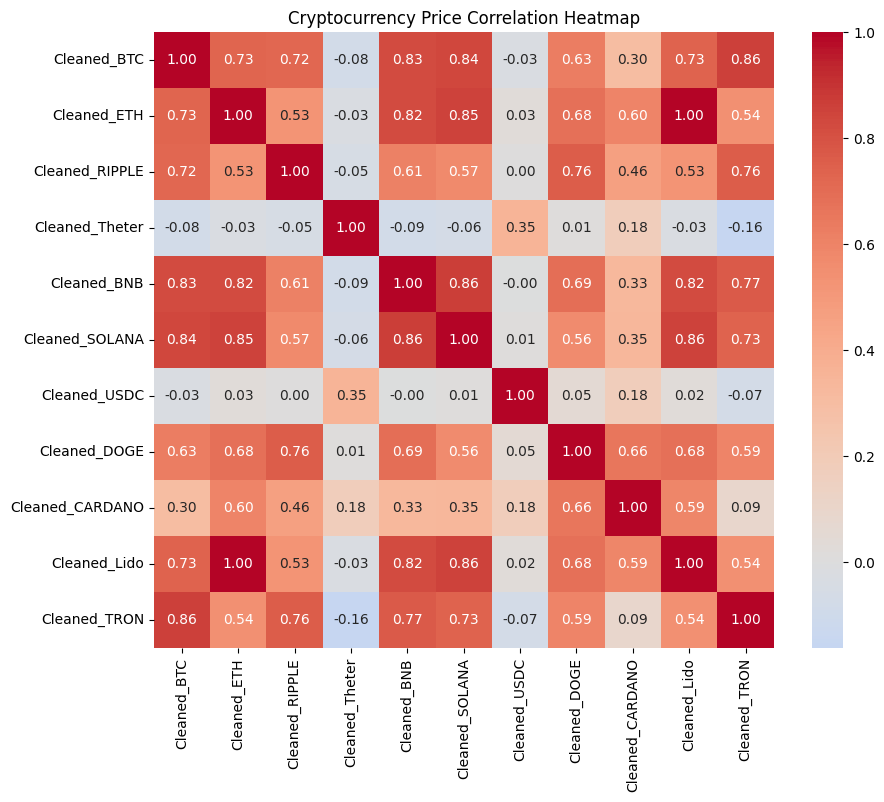

In [73]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Build a DataFrame where each column is the price of a crypto
price_data = {}

for file in cleaned_file_paths:
    crypto_name = os.path.basename(file).replace(".csv", "")
    df = pd.read_csv(file)
    df.reset_index(inplace=True)
    df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')
    df = df.sort_values(by='Date')
    df = df.set_index('Date')
    price_data[crypto_name] = df['Price']

# Combine into one DataFrame
price_df = pd.DataFrame(price_data)

# Drop rows with any missing data
price_df = price_df.dropna(axis=0, how='any')

# Calculate the correlation matrix
correlation_matrix = price_df.corr()

# Extract upper triangle of the correlation matrix, ignoring self-correlation
corr_pairs = []

for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        crypto1 = correlation_matrix.columns[i]
        crypto2 = correlation_matrix.columns[j]
        corr_value = correlation_matrix.iloc[i, j]
        corr_pairs.append((crypto1, crypto2, corr_value))

# Sort by correlation descending
corr_pairs = sorted(corr_pairs, key=lambda x: abs(x[2]), reverse=True)

# Display top 5 most correlated pairs
print("Top 5 Most Correlated Cryptocurrency Pairs:")
for i in range(5):
    print(f"{corr_pairs[i][0]} and {corr_pairs[i][1]}: correlation = {corr_pairs[i][2]:.4f}")

# Plot a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")
plt.title('Cryptocurrency Price Correlation Heatmap')
plt.show()


## c. Studying Cross-Currency Correlations by Market Capitalization

Top 5 Most Correlated Cryptocurrency Pairs (Market Cap):
Cleaned_BTC and Cleaned_SOLANA: correlation = 0.9002
Cleaned_Theter and Cleaned_Lido: correlation = 0.8973
Cleaned_Theter and Cleaned_TRON: correlation = 0.8687
Cleaned_BNB and Cleaned_SOLANA: correlation = 0.8494
Cleaned_ETH and Cleaned_BNB: correlation = 0.8482


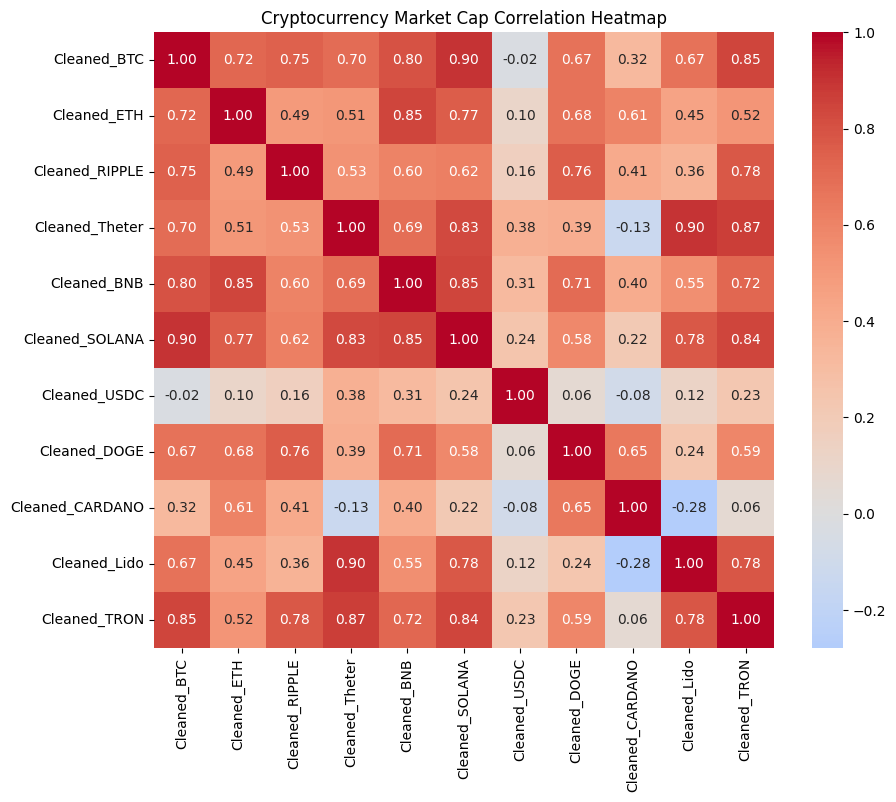

In [74]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Build a DataFrame where each column is the Market Cap of a crypto
market_cap_data = {}

for file in cleaned_file_paths:
    crypto_name = os.path.basename(file).replace(".csv", "")
    df = pd.read_csv(file)
    df.reset_index(inplace=True)
    df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')
    df = df.sort_values(by='Date')
    df = df.set_index('Date')
    market_cap_data[crypto_name] = df['Market_cap']

# Combine into one DataFrame
market_cap_df = pd.DataFrame(market_cap_data)

# Drop rows with any missing data
market_cap_df = market_cap_df.dropna(axis=0, how='any')

# Calculate the correlation matrix
market_cap_corr_matrix = market_cap_df.corr()

# Extract upper triangle of the correlation matrix, ignoring self-correlation
corr_pairs_market_cap = []

for i in range(len(market_cap_corr_matrix.columns)):
    for j in range(i+1, len(market_cap_corr_matrix.columns)):
        crypto1 = market_cap_corr_matrix.columns[i]
        crypto2 = market_cap_corr_matrix.columns[j]
        corr_value = market_cap_corr_matrix.iloc[i, j]
        corr_pairs_market_cap.append((crypto1, crypto2, corr_value))

# Sort by correlation descending
corr_pairs_market_cap = sorted(corr_pairs_market_cap, key=lambda x: abs(x[2]), reverse=True)

# Display top 5 most correlated pairs (by Market Cap)
print("Top 5 Most Correlated Cryptocurrency Pairs (Market Cap):")
for i in range(5):
    print(f"{corr_pairs_market_cap[i][0]} and {corr_pairs_market_cap[i][1]}: correlation = {corr_pairs_market_cap[i][2]:.4f}")

# Plot a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(market_cap_corr_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")
plt.title('Cryptocurrency Market Cap Correlation Heatmap')
plt.show()


## d. Revisiting Price and Market Capitalization Correlations

Price vs Market Cap Correlation for each Cryptocurrency:
Cleaned_BTC: correlation = 0.9996
Cleaned_ETH: correlation = 0.9995
Cleaned_RIPPLE: correlation = 0.9852
Cleaned_Theter: correlation = -0.0067
Cleaned_BNB: correlation = 0.9985
Cleaned_SOLANA: correlation = 0.9691
Cleaned_USDC: correlation = -0.1391
Cleaned_DOGE: correlation = 0.9978
Cleaned_CARDANO: correlation = 0.9965
Cleaned_Lido: correlation = 0.4309
Cleaned_TRON: correlation = 0.9900


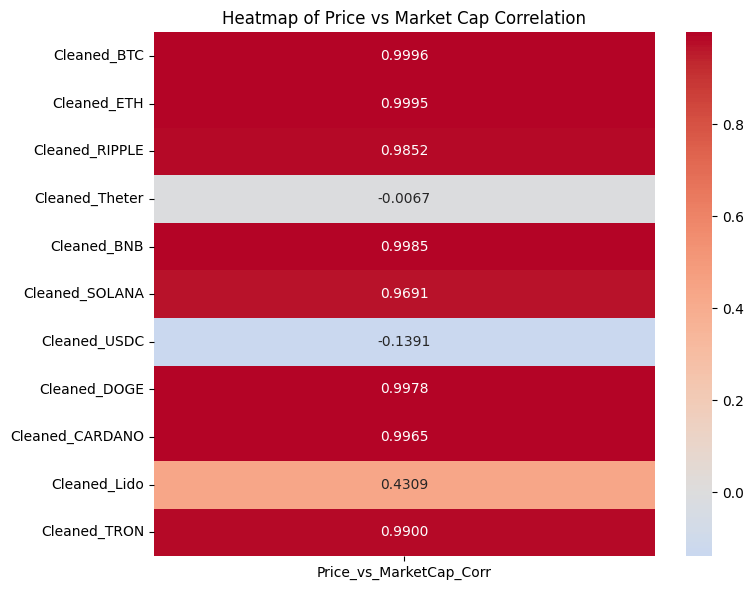

In [75]:
# --- Price vs Market Cap Correlation per Cryptocurrency ---

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

price_marketcap_corr = {}

# Loop through each crypto file
for file in cleaned_file_paths:
    crypto_name = os.path.basename(file).replace(".csv", "")
    df = pd.read_csv(file)
    df.reset_index(inplace=True)
    df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')
    df = df.sort_values(by='Date')

    # Drop missing values
    df = df[['Price', 'Market_cap']].dropna()

    if not df.empty:
        correlation = df['Price'].corr(df['Market_cap'])
        price_marketcap_corr[crypto_name] = correlation
    else:
        price_marketcap_corr[crypto_name] = np.nan

# Print the correlations
print("Price vs Market Cap Correlation for each Cryptocurrency:")
for crypto, corr in price_marketcap_corr.items():
    print(f"{crypto}: correlation = {corr:.4f}")

# Convert to DataFrame for heatmap
corr_df = pd.DataFrame.from_dict(price_marketcap_corr, orient='index', columns=['Price_vs_MarketCap_Corr'])

plt.figure(figsize=(8, 6))
sns.heatmap(corr_df, annot=True, cmap='coolwarm', center=0, fmt=".4f", cbar=True)
plt.title('Heatmap of Price vs Market Cap Correlation')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


## e. Saving Statistics to Google Sheet

In [76]:
!pip install --upgrade gspread gspread_dataframe google-auth google-auth-oauthlib

from google.colab import auth
auth.authenticate_user()

import gspread
from google.auth import default
from gspread_dataframe import set_with_dataframe

# Authenticate
creds, _ = default()
gc = gspread.authorize(creds)

# Convert statistics dictionary to DataFrame
stats_df = pd.DataFrame(statistics).T  # Crypto names as rows

# Create a new Google Sheet
spreadsheet = gc.create('Crypto Statistics')

# Select the first worksheet
worksheet = spreadsheet.get_worksheet(0)

# Upload the DataFrame
set_with_dataframe(worksheet, stats_df)

print(f"Data uploaded to Google Sheets: {spreadsheet.url}")


Data uploaded to Google Sheets: https://docs.google.com/spreadsheets/d/1LwOJRMQJdfTOh5THbgZTqOupyrdi1Sj5HfE-FPr3c9w


## f. Identifying Trends and Patterns (Price & Market Cap)

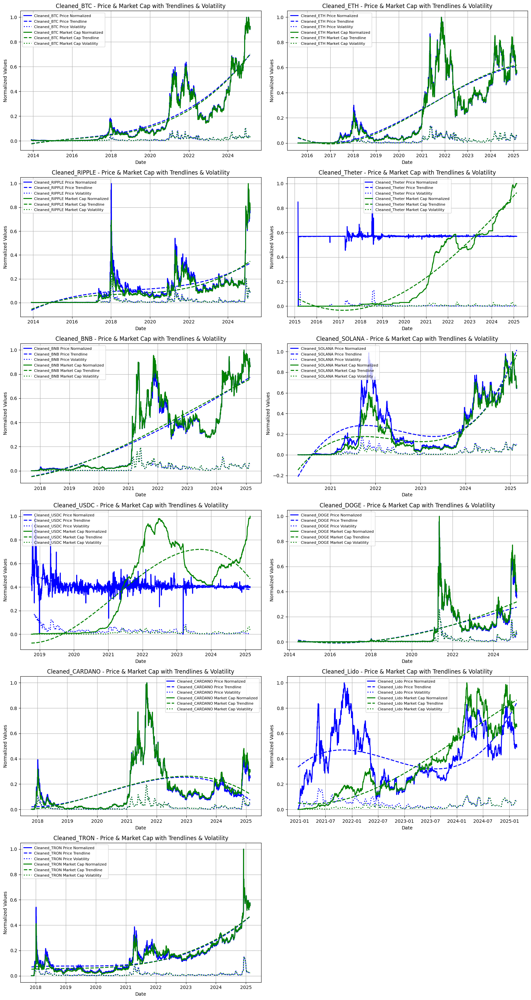

In [77]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
import glob
import os

# Function to add trendline (polynomial regression) and volatility (rolling std) to the plots
def plot_trends_and_volatility(df, ax, crypto_name, window_size=30, degree=3):
    # Features: Price and Market Cap
    features = ['Price_normalized', 'Market_cap_normalized']
    colors = ['blue', 'green']
    labels = ['Price', 'Market Cap']

    for i, feature in enumerate(features):
        y = df[feature].values
        x = np.arange(len(df))
        poly = PolynomialFeatures(degree=degree)
        x_poly = poly.fit_transform(x.reshape(-1, 1))
        model = LinearRegression().fit(x_poly, y)
        trendline = model.predict(x_poly)

        # Volatility: Rolling standard deviation
        volatility = df[feature].rolling(window=window_size).std()

        # Plot the original data
        ax.plot(df['Date'], df[feature], label=f'{crypto_name} {labels[i]} Normalized', color=colors[i], linewidth=2)

        # Plot the trendline
        ax.plot(df['Date'], trendline, label=f'{crypto_name} {labels[i]} Trendline', color=colors[i], linestyle='--', linewidth=2)

        # Plot the volatility
        ax.plot(df['Date'], volatility, label=f'{crypto_name} {labels[i]} Volatility', color=colors[i], linestyle=':', linewidth=2)

    # Labels and legend
    ax.set_title(f'{crypto_name} - Price & Market Cap with Trendlines & Volatility', fontsize=12)
    ax.set_xlabel('Date')
    ax.set_ylabel('Normalized Values')
    ax.legend(fontsize=8)
    ax.grid(True)

# Function to plot trends and volatility for each cryptocurrency
def plot_trends_and_volatility_for_all(file_paths, window_size=30, degree=3):
    n = len(file_paths)
    n_cols = 2
    n_rows = (n + 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 5 * n_rows))
    axes = axes.flatten()  # Flatten in case of (n_rows, n_cols) array

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")
        df = pd.read_csv(file)

        # Reset index and parse the Date column
        df.reset_index(inplace=True)
        df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')
        df = df.sort_values(by='Date')

        # Plot on the appropriate subplot
        plot_trends_and_volatility(df, axes[idx], crypto_name, window_size=window_size, degree=degree)

    # Hide any empty subplots
    for j in range(idx + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# New file paths: cleaned files
cleaned_file_paths = glob.glob("/content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/*.csv")

# Plot trends and volatility for all cryptocurrencies (Price and Market Cap)
plot_trends_and_volatility_for_all(cleaned_file_paths, window_size=30, degree=3)


## g. Zooming in on Trendlines for Price & Market Cap

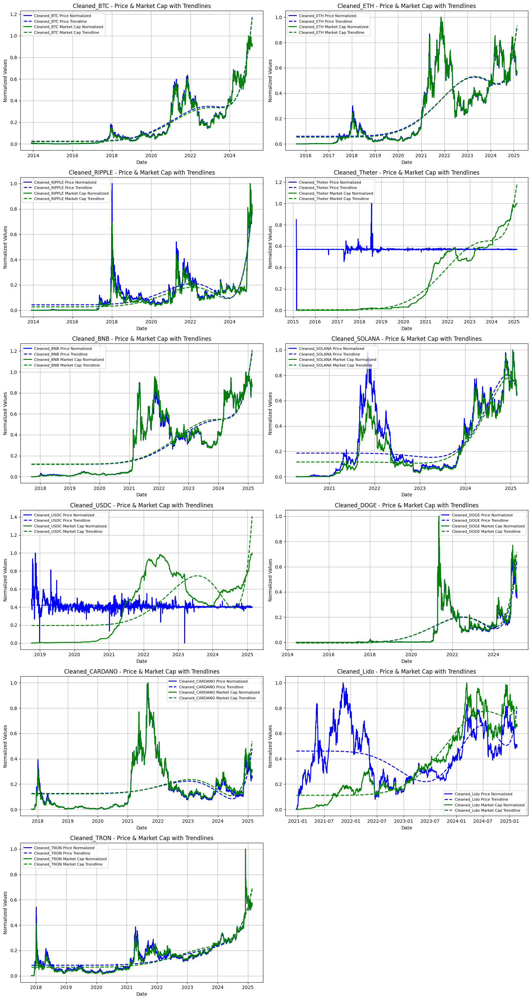

In [78]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
import glob
import os

# Function to add trendline (higher degree polynomial regression) to the plots
def plot_trends(df, ax, crypto_name, degree=8):
    features = ['Price_normalized', 'Market_cap_normalized']
    colors = ['blue', 'green']
    labels = ['Price', 'Market Cap']

    for i, feature in enumerate(features):
        y = df[feature].values
        x = np.arange(len(df))

        # Higher-degree polynomial regression for trendline
        poly = PolynomialFeatures(degree=degree)
        x_poly = poly.fit_transform(x.reshape(-1, 1))
        model = LinearRegression().fit(x_poly, y)
        trendline = model.predict(x_poly)

        # Plot the original data
        ax.plot(df['Date'], df[feature], label=f'{crypto_name} {labels[i]} Normalized', color=colors[i], linewidth=2)

        # Plot the trendline
        ax.plot(df['Date'], trendline, label=f'{crypto_name} {labels[i]} Trendline', color=colors[i], linestyle='--', linewidth=2)

    # Labels and legend
    ax.set_title(f'{crypto_name} - Price & Market Cap with Trendlines', fontsize=12)
    ax.set_xlabel('Date')
    ax.set_ylabel('Normalized Values')
    ax.legend(fontsize=8)
    ax.grid(True)

# Function to plot trends for each cryptocurrency (2 plots per row)
def plot_trends_for_all(file_paths, degree=8):
    n = len(file_paths)
    n_cols = 2
    n_rows = (n + 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 5 * n_rows))
    axes = axes.flatten()  # flatten for easier indexing

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")
        df = pd.read_csv(file)

        # Reset index and parse the Date column
        df.reset_index(inplace=True)
        df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')
        df = df.sort_values(by='Date')

        # Plot the trends for each cryptocurrency
        plot_trends(df, axes[idx], crypto_name, degree=degree)

    # Hide any empty plots
    for j in range(idx + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# --- Run it ---

# New file paths: cleaned files
cleaned_file_paths = glob.glob("/content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/*.csv")

# Plot trends for all cryptocurrencies (Price and Market Cap)
plot_trends_for_all(cleaned_file_paths, degree=10)


# **6. Trend Identification & Prediction**
### Using trend identification to make predictions for future cryptocurrency prices and market caps.

## a. Predictions Through Linear Regression (Month)

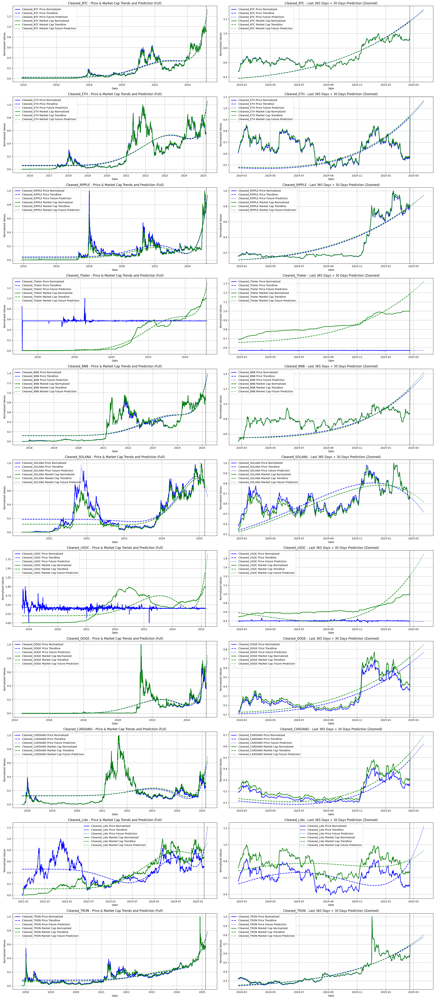

In [79]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Function to plot trends and predict future trends
def plot_trends_with_prediction(df, ax_full, ax_zoom, crypto_name, degree=10, predict_days=30):
    features = ['Price_normalized', 'Market_cap_normalized']
    colors = ['blue', 'green']
    labels = ['Price', 'Market Cap']

    for i, feature in enumerate(features):
        y = df[feature].values
        x = np.arange(len(df))

        # Fit polynomial model
        poly = PolynomialFeatures(degree=degree)
        x_poly = poly.fit_transform(x.reshape(-1, 1))
        model = LinearRegression().fit(x_poly, y)

        # Predict on current data
        trendline = model.predict(x_poly)

        # Extend x for future prediction
        future_x = np.arange(len(df) + predict_days)
        future_x_poly = poly.transform(future_x.reshape(-1, 1))
        future_trendline = model.predict(future_x_poly)

        # Extend date range
        last_date = df['Date'].iloc[-1]
        future_dates = pd.date_range(start=last_date + pd.Timedelta(days=1), periods=predict_days)
        all_dates = pd.concat([df['Date'], pd.Series(future_dates)], ignore_index=True)

        # Combine historical and future data for plotting
        all_values = np.concatenate([y, future_trendline[-predict_days:]])

        # Plot on full range graph
        ax_full.plot(df['Date'], df[feature], label=f'{crypto_name} {labels[i]} Normalized', color=colors[i], linewidth=2)
        ax_full.plot(df['Date'], trendline, label=f'{crypto_name} {labels[i]} Trendline', color=colors[i], linestyle='--', linewidth=2)
        ax_full.plot(all_dates, future_trendline, label=f'{crypto_name} {labels[i]} Future Prediction', color=colors[i], linestyle=':', linewidth=2)

        # Add vertical line to separate historical and prediction (full plot)
        split_date = df['Date'].iloc[-1]
        ax_full.axvline(x=split_date, color='black', linestyle=':', linewidth=2)

        # Plot zoomed-in (last 365 + 30 future days)
        if len(df) >= 365:
            zoom_start_idx = len(df) - 365
        else:
            zoom_start_idx = 0

        zoom_dates = pd.concat([df['Date'][zoom_start_idx:], pd.Series(future_dates)], ignore_index=True)
        zoom_values = np.concatenate([y[zoom_start_idx:], future_trendline[-predict_days:]])

        ax_zoom.plot(zoom_dates[:len(y[zoom_start_idx:])], y[zoom_start_idx:], label=f'{crypto_name} {labels[i]} Normalized', color=colors[i], linewidth=2)
        ax_zoom.plot(zoom_dates[:len(trendline[zoom_start_idx:])], trendline[zoom_start_idx:], label=f'{crypto_name} {labels[i]} Trendline', color=colors[i], linestyle='--', linewidth=2)
        ax_zoom.plot(zoom_dates, zoom_values, label=f'{crypto_name} {labels[i]} Future Prediction', color=colors[i], linestyle=':', linewidth=2)

        # Add vertical line to separate historical and prediction (zoomed plot)
        ax_zoom.axvline(x=split_date, color='black', linestyle=':', linewidth=2)

    # Full graph settings
    ax_full.set_title(f'{crypto_name} - Price & Market Cap Trends and Prediction (Full)')
    ax_full.set_xlabel('Date')
    ax_full.set_ylabel('Normalized Values')
    ax_full.legend()
    ax_full.grid(True)

    # Zoomed graph settings
    ax_zoom.set_title(f'{crypto_name} - Last 365 Days + 30 Days Prediction (Zoomed)')
    ax_zoom.set_xlabel('Date')
    ax_zoom.set_ylabel('Normalized Values')
    ax_zoom.legend()
    ax_zoom.grid(True)

# Function to plot trends for all cryptocurrencies
def plot_trends_for_all_with_prediction(file_paths, degree=10, predict_days=30):
    fig, axes = plt.subplots(len(file_paths), 2, figsize=(24, 5 * len(file_paths)))

    if len(file_paths) == 1:
        axes = np.expand_dims(axes, axis=0)

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")
        df = pd.read_csv(file)

        # Reset index and parse the Date column
        df.reset_index(inplace=True)
        df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')
        df = df.sort_values(by='Date')

        # Plot trends and predictions
        plot_trends_with_prediction(df, axes[idx, 0], axes[idx, 1], crypto_name, degree=degree, predict_days=predict_days)

    plt.tight_layout()
    plt.show()

cleaned_file_paths = glob.glob("/content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/*.csv")

# Plot trends and predict 30 days into the future
plot_trends_for_all_with_prediction(cleaned_file_paths, degree=10, predict_days=30)


## b. Predictions Through Ridge Regression (Month)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.44775e-79): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.44775e-79): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=1.04692e-77): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=1.04692e-77): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarnin

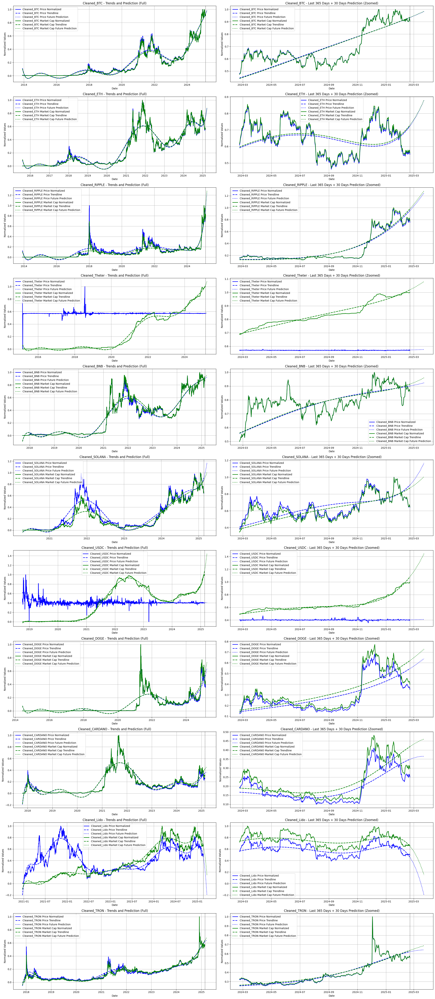

In [80]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge

def plot_accurate_trends_with_prediction(df, ax_full, ax_zoom, crypto_name, degree=10, predict_days=30, alpha=0.0001):
    features = ['Price_normalized', 'Market_cap_normalized']
    colors = ['blue', 'green']
    labels = ['Price', 'Market Cap']

    for i, feature in enumerate(features):
        y = df[feature].values
        x = np.arange(len(df))

        # Fit polynomial model using Ridge Regression
        poly = PolynomialFeatures(degree=degree)
        x_poly = poly.fit_transform(x.reshape(-1, 1))
        model = Ridge(alpha=alpha).fit(x_poly, y)

        # Predict on current data
        trendline = model.predict(x_poly)

        # Extend x for future prediction
        future_x = np.arange(len(df) + predict_days)
        future_x_poly = poly.transform(future_x.reshape(-1, 1))
        future_trendline = model.predict(future_x_poly)

        # Extend date range
        last_date = df['Date'].iloc[-1]
        future_dates = pd.date_range(start=last_date + pd.Timedelta(days=1), periods=predict_days)
        all_dates = pd.concat([df['Date'], pd.Series(future_dates)], ignore_index=True)

        # Combine historical and future data for plotting
        all_values = np.concatenate([y, future_trendline[-predict_days:]])

        # Plot on full range graph
        ax_full.plot(df['Date'], df[feature], label=f'{crypto_name} {labels[i]} Normalized', color=colors[i], linewidth=2)
        ax_full.plot(df['Date'], trendline, label=f'{crypto_name} {labels[i]} Trendline', color=colors[i], linestyle='--', linewidth=2)
        ax_full.plot(all_dates, future_trendline, label=f'{crypto_name} {labels[i]} Future Prediction', color=colors[i], linestyle=':', linewidth=2)

        # Add vertical line at the boundary between real and predicted data
        ax_full.axvline(x=last_date, color='black', linestyle=':', linewidth=1)

        # Plot zoomed-in (last 365 + 30 future days)
        if len(df) >= 365:
            zoom_start_idx = len(df) - 365
        else:
            zoom_start_idx = 0

        zoom_dates = pd.concat([df['Date'][zoom_start_idx:], pd.Series(future_dates)], ignore_index=True)
        zoom_y = y[zoom_start_idx:]
        zoom_trendline = trendline[zoom_start_idx:]
        zoom_future = future_trendline[-(predict_days + len(zoom_y)):]

        ax_zoom.plot(zoom_dates[:len(zoom_y)], zoom_y, label=f'{crypto_name} {labels[i]} Normalized', color=colors[i], linewidth=2)
        ax_zoom.plot(zoom_dates[:len(zoom_trendline)], zoom_trendline, label=f'{crypto_name} {labels[i]} Trendline', color=colors[i], linestyle='--', linewidth=2)
        ax_zoom.plot(zoom_dates, np.concatenate([zoom_trendline, future_trendline[-predict_days:]]), label=f'{crypto_name} {labels[i]} Future Prediction', color=colors[i], linestyle=':', linewidth=2)

        # Add vertical line on zoomed plot too
        ax_zoom.axvline(x=last_date, color='black', linestyle=':', linewidth=1)

    # Full graph settings
    ax_full.set_title(f'{crypto_name} - Trends and Prediction (Full)')
    ax_full.set_xlabel('Date')
    ax_full.set_ylabel('Normalized Values')
    ax_full.legend()
    ax_full.grid(True)

    # Zoomed graph settings
    ax_zoom.set_title(f'{crypto_name} - Last 365 Days + 30 Days Prediction (Zoomed)')
    ax_zoom.set_xlabel('Date')
    ax_zoom.set_ylabel('Normalized Values')
    ax_zoom.legend()
    ax_zoom.grid(True)

# Function to plot trends for all cryptocurrencies
def plot_accurate_trends_for_all(file_paths, degree=10, predict_days=30, alpha=0.0001):
    fig, axes = plt.subplots(len(file_paths), 2, figsize=(24, 5 * len(file_paths)))

    if len(file_paths) == 1:
        axes = np.expand_dims(axes, axis=0)

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")
        df = pd.read_csv(file)

        # Reset index and parse the Date column
        df.reset_index(inplace=True)
        df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')
        df = df.sort_values(by='Date')

        # Plot trends and predictions
        plot_accurate_trends_with_prediction(df, axes[idx, 0], axes[idx, 1], crypto_name, degree=degree, predict_days=predict_days, alpha=alpha)

    plt.tight_layout()
    plt.show()

cleaned_file_paths = glob.glob("/content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/*.csv")

plot_accurate_trends_for_all(cleaned_file_paths, degree=10, predict_days=30, alpha=0.0001)


## c. Predictions Through Ridge Regression (Day)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.44775e-79): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.44775e-79): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=1.04692e-77): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=1.04692e-77): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarnin

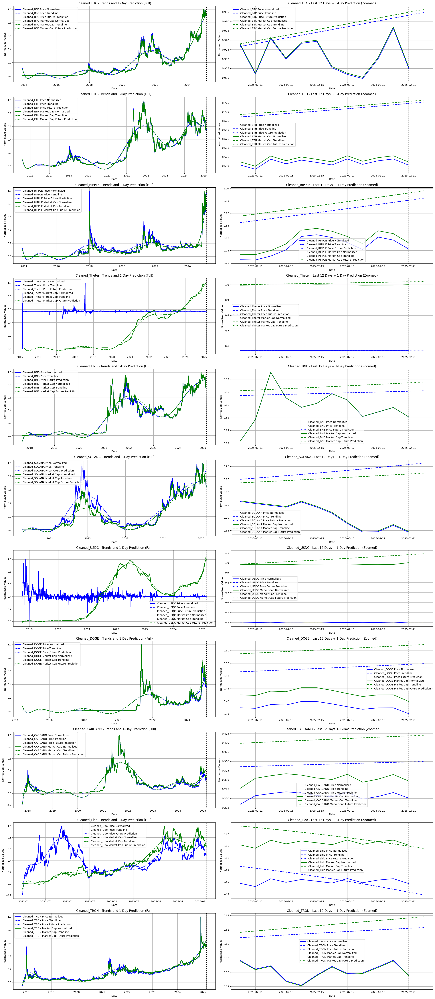

In [81]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge

def plot_accurate_trends_with_prediction(df, ax_full, ax_zoom, crypto_name, degree=10, predict_days=1, alpha=0.0001):
    features = ['Price_normalized', 'Market_cap_normalized']
    colors = ['blue', 'green']
    labels = ['Price', 'Market Cap']

    for i, feature in enumerate(features):
        y = df[feature].values
        x = np.arange(len(df))

        # Fit polynomial model using Ridge Regression
        poly = PolynomialFeatures(degree=degree)
        x_poly = poly.fit_transform(x.reshape(-1, 1))
        model = Ridge(alpha=alpha).fit(x_poly, y)

        # Predict on current data
        trendline = model.predict(x_poly)

        # Extend x for future prediction
        future_x = np.arange(len(df) + predict_days)
        future_x_poly = poly.transform(future_x.reshape(-1, 1))
        future_trendline = model.predict(future_x_poly)

        # Extend date range
        last_date = df['Date'].iloc[-1]
        future_dates = pd.date_range(start=last_date + pd.Timedelta(days=1), periods=predict_days)
        all_dates = pd.concat([df['Date'], pd.Series(future_dates)], ignore_index=True)

        # Plot on full range graph
        ax_full.plot(df['Date'], df[feature], label=f'{crypto_name} {labels[i]} Normalized', color=colors[i], linewidth=2)
        ax_full.plot(df['Date'], trendline, label=f'{crypto_name} {labels[i]} Trendline', color=colors[i], linestyle='--', linewidth=2)
        ax_full.plot(all_dates, future_trendline, label=f'{crypto_name} {labels[i]} Future Prediction', color=colors[i], linestyle=':', linewidth=2)

        # Add vertical line at prediction start
        ax_full.axvline(x=last_date, color='black', linestyle=':', linewidth=1)

        # --- Zoomed plot: last 12 days + 1 predicted day ---
        days_in_12_days = 12
        if len(df) >= days_in_12_days:
            zoom_start_idx = len(df) - days_in_12_days
        else:
            zoom_start_idx = 0

        zoom_dates = pd.concat([df['Date'][zoom_start_idx:], pd.Series(future_dates)], ignore_index=True)
        zoom_y = y[zoom_start_idx:]
        zoom_trendline = trendline[zoom_start_idx:]

        ax_zoom.plot(zoom_dates[:len(zoom_y)], zoom_y, label=f'{crypto_name} {labels[i]} Normalized', color=colors[i], linewidth=2)
        ax_zoom.plot(zoom_dates[:len(zoom_trendline)], zoom_trendline, label=f'{crypto_name} {labels[i]} Trendline', color=colors[i], linestyle='--', linewidth=2)
        ax_zoom.plot(zoom_dates, np.concatenate([zoom_trendline, future_trendline[-predict_days:]]), label=f'{crypto_name} {labels[i]} Future Prediction', color=colors[i], linestyle=':', linewidth=2)

        # Add vertical line for predicted day
        ax_zoom.axvline(x=last_date, color='black', linestyle=':', linewidth=1)

    # Full graph settings
    ax_full.set_title(f'{crypto_name} - Trends and 1-Day Prediction (Full)')
    ax_full.set_xlabel('Date')
    ax_full.set_ylabel('Normalized Values')
    ax_full.legend()
    ax_full.grid(True)

    # Zoomed graph settings
    ax_zoom.set_title(f'{crypto_name} - Last 12 Days + 1-Day Prediction (Zoomed)')
    ax_zoom.set_xlabel('Date')
    ax_zoom.set_ylabel('Normalized Values')
    ax_zoom.legend()
    ax_zoom.grid(True)

# Function to plot trends for all cryptocurrencies
def plot_accurate_trends_for_all(file_paths, degree=10, predict_days=1, alpha=0.0001):
    fig, axes = plt.subplots(len(file_paths), 2, figsize=(24, 5 * len(file_paths)))

    if len(file_paths) == 1:
        axes = np.expand_dims(axes, axis=0)

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")
        df = pd.read_csv(file)

        # Reset index and parse the Date column
        df.reset_index(inplace=True)
        df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')
        df = df.sort_values(by='Date')

        # Plot trends and predictions
        plot_accurate_trends_with_prediction(df, axes[idx, 0], axes[idx, 1], crypto_name, degree=degree, predict_days=predict_days, alpha=alpha)

    plt.tight_layout()
    plt.show()

cleaned_file_paths = glob.glob("/content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/*.csv")

# Plot trends and predict 1 day into the future
plot_accurate_trends_for_all(cleaned_file_paths, degree=10, predict_days=1, alpha=0.0001)


## d. Predictions Through Ridge Regression (Week)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.44775e-79): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.44775e-79): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=1.04692e-77): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=1.04692e-77): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarnin

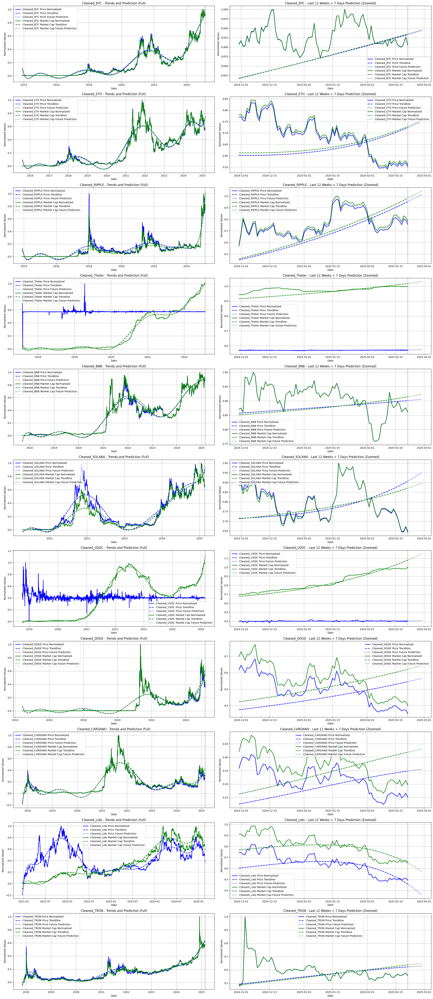

In [82]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge

def plot_accurate_trends_with_prediction(df, ax_full, ax_zoom, crypto_name, degree=10, predict_days=7, alpha=0.0001):
    features = ['Price_normalized', 'Market_cap_normalized']
    colors = ['blue', 'green']
    labels = ['Price', 'Market Cap']

    for i, feature in enumerate(features):
        y = df[feature].values
        x = np.arange(len(df))

        # Fit polynomial model using Ridge Regression
        poly = PolynomialFeatures(degree=degree)
        x_poly = poly.fit_transform(x.reshape(-1, 1))
        model = Ridge(alpha=alpha).fit(x_poly, y)

        # Predict on current data
        trendline = model.predict(x_poly)

        # Extend x for future prediction
        future_x = np.arange(len(df) + predict_days)
        future_x_poly = poly.transform(future_x.reshape(-1, 1))
        future_trendline = model.predict(future_x_poly)

        # Extend date range
        last_date = df['Date'].iloc[-1]
        future_dates = pd.date_range(start=last_date + pd.Timedelta(days=1), periods=predict_days)
        all_dates = pd.concat([df['Date'], pd.Series(future_dates)], ignore_index=True)

        # Combine historical and future data for plotting
        all_values = np.concatenate([y, future_trendline[-predict_days:]])

        # Plot on full range graph
        ax_full.plot(df['Date'], df[feature], label=f'{crypto_name} {labels[i]} Normalized', color=colors[i], linewidth=2)
        ax_full.plot(df['Date'], trendline, label=f'{crypto_name} {labels[i]} Trendline', color=colors[i], linestyle='--', linewidth=2)
        ax_full.plot(all_dates, future_trendline, label=f'{crypto_name} {labels[i]} Future Prediction', color=colors[i], linestyle=':', linewidth=2)

        # Add vertical line at the boundary between real and predicted data
        ax_full.axvline(x=last_date, color='black', linestyle=':', linewidth=1)

        # --- Zoomed plot: last 12 weeks (84 days) + 7 days future ---
        days_in_12_weeks = 12 * 7  # 12 weeks = 84 days
        if len(df) >= days_in_12_weeks:
            zoom_start_idx = len(df) - days_in_12_weeks
        else:
            zoom_start_idx = 0

        zoom_dates = pd.concat([df['Date'][zoom_start_idx:], pd.Series(future_dates)], ignore_index=True)
        zoom_y = y[zoom_start_idx:]
        zoom_trendline = trendline[zoom_start_idx:]
        zoom_future = future_trendline[-(predict_days + len(zoom_y)):]

        ax_zoom.plot(zoom_dates[:len(zoom_y)], zoom_y, label=f'{crypto_name} {labels[i]} Normalized', color=colors[i], linewidth=2)
        ax_zoom.plot(zoom_dates[:len(zoom_trendline)], zoom_trendline, label=f'{crypto_name} {labels[i]} Trendline', color=colors[i], linestyle='--', linewidth=2)
        ax_zoom.plot(zoom_dates, np.concatenate([zoom_trendline, future_trendline[-predict_days:]]), label=f'{crypto_name} {labels[i]} Future Prediction', color=colors[i], linestyle=':', linewidth=2)

        # Add vertical line on zoomed plot too
        ax_zoom.axvline(x=last_date, color='black', linestyle=':', linewidth=1)

    # Full graph settings
    ax_full.set_title(f'{crypto_name} - Trends and Prediction (Full)')
    ax_full.set_xlabel('Date')
    ax_full.set_ylabel('Normalized Values')
    ax_full.legend()
    ax_full.grid(True)

    # Zoomed graph settings
    ax_zoom.set_title(f'{crypto_name} - Last 12 Weeks + 7 Days Prediction (Zoomed)')  # <== updated title
    ax_zoom.set_xlabel('Date')
    ax_zoom.set_ylabel('Normalized Values')
    ax_zoom.legend()
    ax_zoom.grid(True)

# Function to plot trends for all cryptocurrencies
def plot_accurate_trends_for_all(file_paths, degree=10, predict_days=7, alpha=0.0001):
    fig, axes = plt.subplots(len(file_paths), 2, figsize=(24, 5 * len(file_paths)))

    if len(file_paths) == 1:
        axes = np.expand_dims(axes, axis=0)

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")
        df = pd.read_csv(file)

        # Reset index and parse the Date column
        df.reset_index(inplace=True)
        df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')
        df = df.sort_values(by='Date')

        # Plot trends and predictions
        plot_accurate_trends_with_prediction(df, axes[idx, 0], axes[idx, 1], crypto_name, degree=degree, predict_days=predict_days, alpha=alpha)

    plt.tight_layout()
    plt.show()

cleaned_file_paths = glob.glob("/content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/*.csv")

plot_accurate_trends_for_all(cleaned_file_paths, degree=10, predict_days=7, alpha=0.0001)


## e. Predictions Through Ridge Regression (Year)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.44775e-79): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.44775e-79): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=1.04692e-77): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=1.04692e-77): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_ridge.py:215: LinAlgWarnin

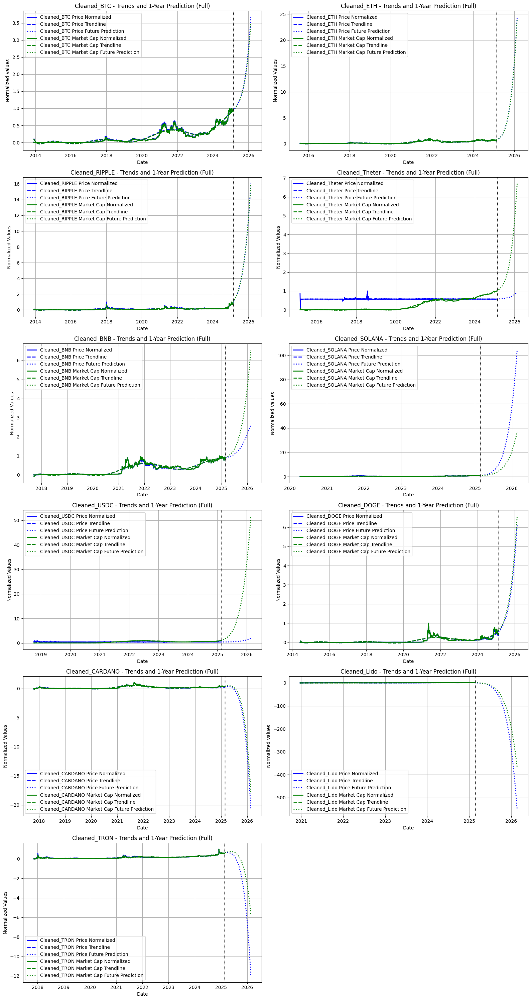

In [83]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge

def plot_accurate_trends_with_prediction(df, ax_full, crypto_name, degree=10, predict_days=365, alpha=0.0001):
    features = ['Price_normalized', 'Market_cap_normalized']
    colors = ['blue', 'green']
    labels = ['Price', 'Market Cap']

    for i, feature in enumerate(features):
        y = df[feature].values
        x = np.arange(len(df))

        # Fit polynomial model using Ridge Regression
        poly = PolynomialFeatures(degree=degree)
        x_poly = poly.fit_transform(x.reshape(-1, 1))
        model = Ridge(alpha=alpha).fit(x_poly, y)

        # Predict on current data
        trendline = model.predict(x_poly)

        # Extend x for future prediction
        future_x = np.arange(len(df) + predict_days)
        future_x_poly = poly.transform(future_x.reshape(-1, 1))
        future_trendline = model.predict(future_x_poly)

        # Extend date range
        last_date = df['Date'].iloc[-1]
        future_dates = pd.date_range(start=last_date + pd.Timedelta(days=1), periods=predict_days)
        all_dates = pd.concat([df['Date'], pd.Series(future_dates)], ignore_index=True)

        # Plot
        ax_full.plot(df['Date'], df[feature], label=f'{crypto_name} {labels[i]} Normalized', color=colors[i], linewidth=2)
        ax_full.plot(df['Date'], trendline, label=f'{crypto_name} {labels[i]} Trendline', color=colors[i], linestyle='--', linewidth=2)
        ax_full.plot(all_dates, future_trendline, label=f'{crypto_name} {labels[i]} Future Prediction', color=colors[i], linestyle=':', linewidth=2)

        # Add vertical line at the boundary between real and predicted data
        ax_full.axvline(x=last_date, color='black', linestyle=':', linewidth=1)

    # Full graph settings
    ax_full.set_title(f'{crypto_name} - Trends and 1-Year Prediction (Full)')
    ax_full.set_xlabel('Date')
    ax_full.set_ylabel('Normalized Values')
    ax_full.legend()
    ax_full.grid(True)

# Function to plot trends for all cryptocurrencies
def plot_accurate_trends_for_all(file_paths, degree=10, predict_days=365, alpha=0.0001):
    num_files = len(file_paths)
    cols = 2
    rows = (num_files + 1) // 2  # Round up division

    fig, axes = plt.subplots(rows, cols, figsize=(16, 5 * rows))
    axes = axes.flatten()  # Flatten in case axes is a 2D array

    for idx, file in enumerate(file_paths):
        crypto_name = os.path.basename(file).replace(".csv", "")
        df = pd.read_csv(file)

        # Reset index and parse the Date column
        df.reset_index(inplace=True)
        df['Date'] = pd.to_datetime(df['Date'], utc=True, errors='coerce')
        df = df.sort_values(by='Date')

        # Plot trends and predictions
        plot_accurate_trends_with_prediction(df, axes[idx], crypto_name, degree=degree, predict_days=predict_days, alpha=alpha)

    # Hide any unused subplots
    for j in range(idx + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

cleaned_file_paths = glob.glob("/content/drive/My Drive/ELEC3612 Crypto Project/Cleaned_Transformed_Data/*.csv")

# Plot trends and predict 1 year into the future
plot_accurate_trends_for_all(cleaned_file_paths, degree=10, predict_days=365, alpha=0.0001)
